In [410]:
import cv2
# import PIL as plt
from matplotlib import pyplot as plt

First we need to open an image in python with open_CV and create the object with it

In [411]:
image_file = "images/imagen_ejemplo.png"
image_file_object = cv2.imread(image_file)

If we need to see the image we can do it using the following code

In [412]:
# cv2.imshow("original image", image_file_object)
# cv2.waitKey(20)
#This might crash your computer if you're in jjupyter notebooks because it creates an infinite loop
#Another option is to use this function that's based in matplotlib
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

In [413]:
display(image_file)

So now that we have our image open we're gonna suppouse that it has some problems and we're gonna pply all these methods so we finally got some different versions of the same image and we can see which one works better with the ocr.

The first thing we're gonna do is to invert the image.  

In [414]:
inverted_image = cv2.bitwise_not(image_file_object)
cv2.imwrite("images/inverted.png", inverted_image)

True

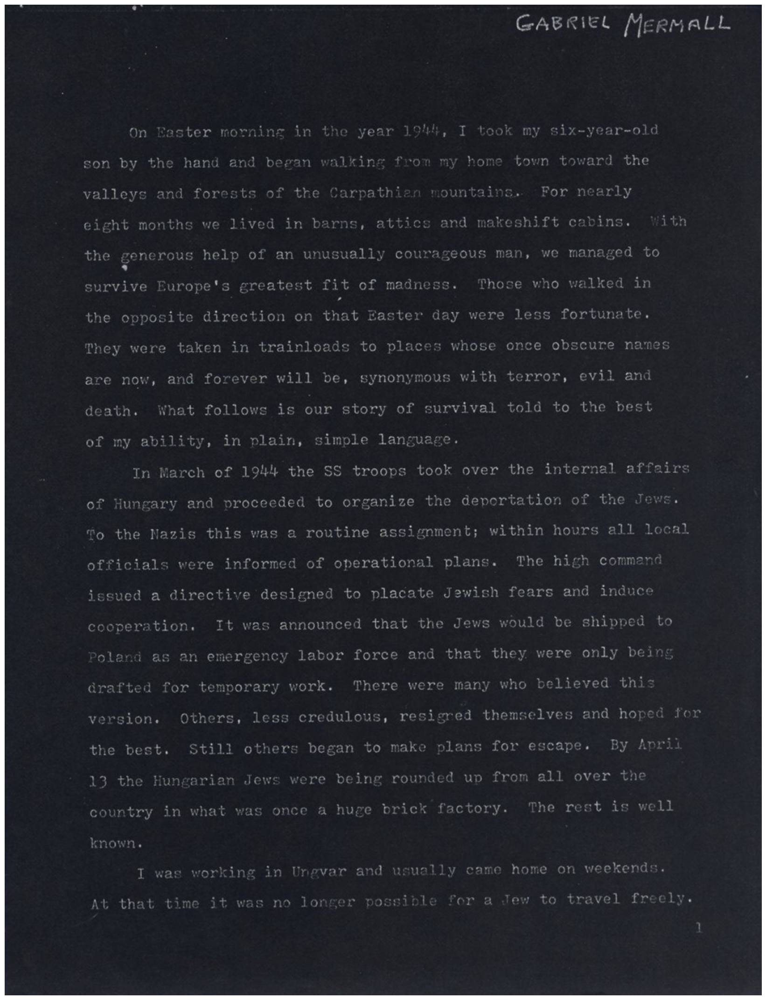

In [415]:
display("images/inverted.png")

As we can see we have inverted the images which means that all the binary codes have turn form 0 to 1 and viceversa. This might be useful for documents with a lot of light. 

We're gonna see now how to rescale an image so we can extract information from it. Minuto 12:49

We're gonna go now with binarization. The binarization is the process to turn an image completly into black and white. To do so we first need to put the image ina scale of grays so it's possible to change it. In order to turn it to gray you can use the following function:

In [416]:
def turn_to_gray(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [417]:
gray_image = turn_to_gray(image_file_object)
cv2.imwrite("images/gray_image.png",gray_image)

True

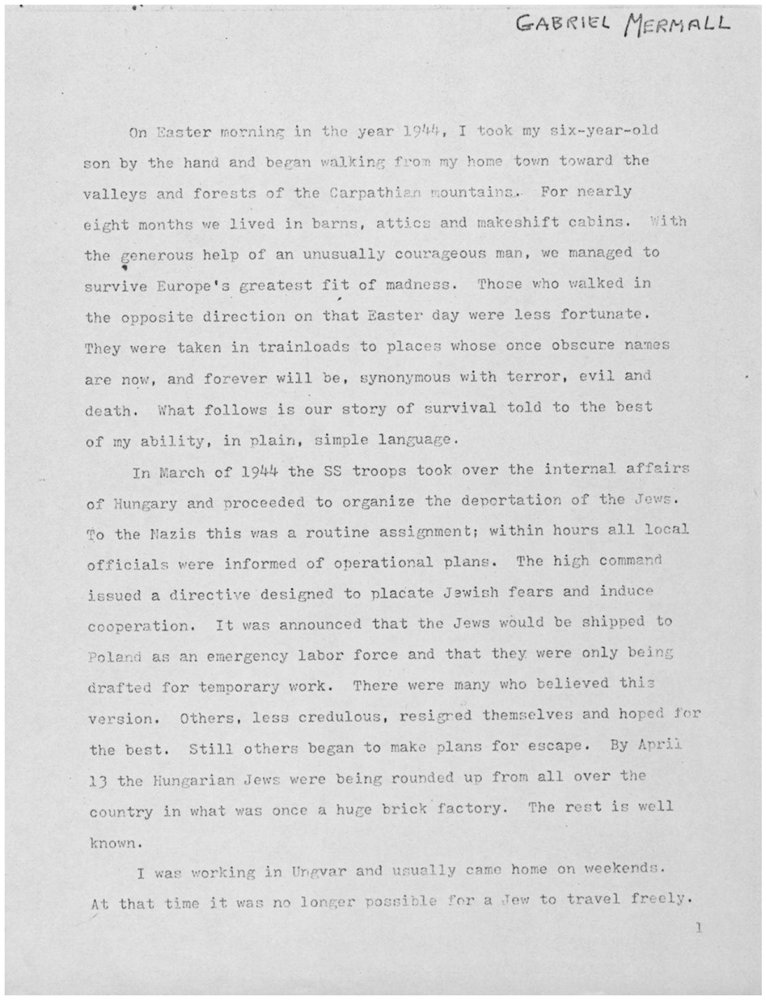

In [418]:
display("images/gray_image.png")

Now that we have our image in gray is the time to binarize it. In order to do so we do the following:

In [419]:
thresh, im_bw = cv2.threshold(gray_image,210,230, cv2.THRESH_BINARY)
#These numbers is with what we start at the beggining but it can change depending on the image that you're processing. 
cv2.imwrite("images/bw_image.png",im_bw)

True

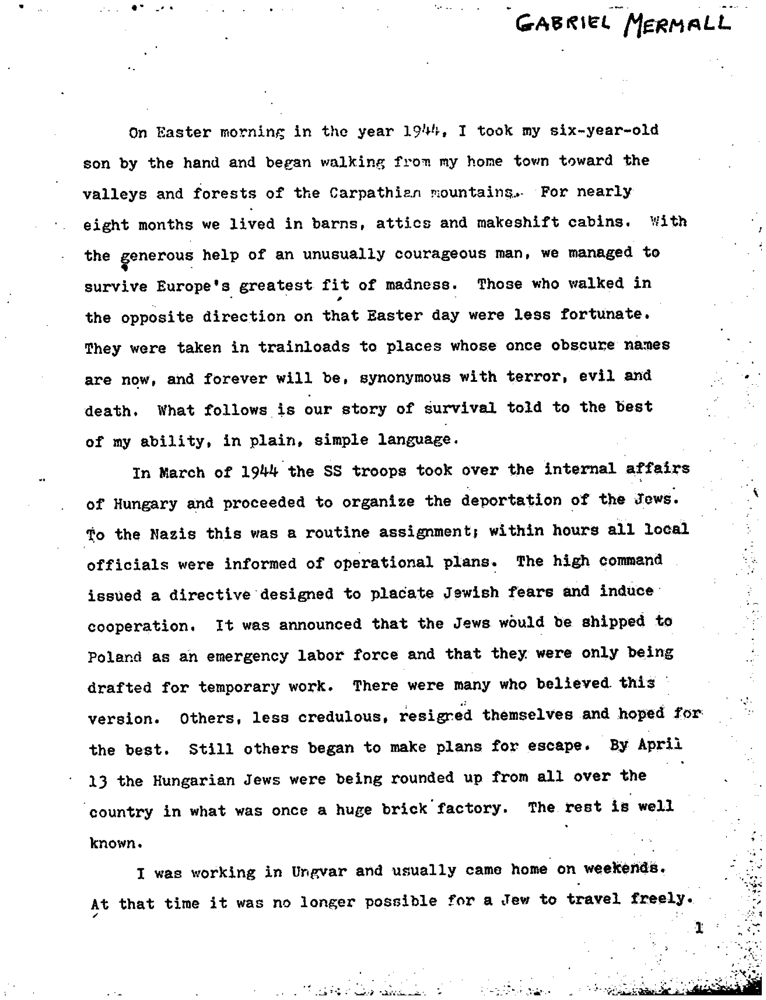

In [420]:
display("images/bw_image.png")

Now we have a good image that we can process via the OCR. If there were problems is also good to use the two numbers u and try to change them, being the second normally bigger than the first.

Let's talk now about noise removal which is quite important for some images that can give us problems. 

In [421]:
def noise_removal(image):
    import numpy as np
    kernel = np.ones((1,1), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    kernel = np.ones((1,1), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    #Here is when the real noise removal starts
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image,3)
    return (image)

In [422]:
no_noise_image = noise_removal(im_bw)
cv2.imwrite("images/no_noise.png",no_noise_image)

True

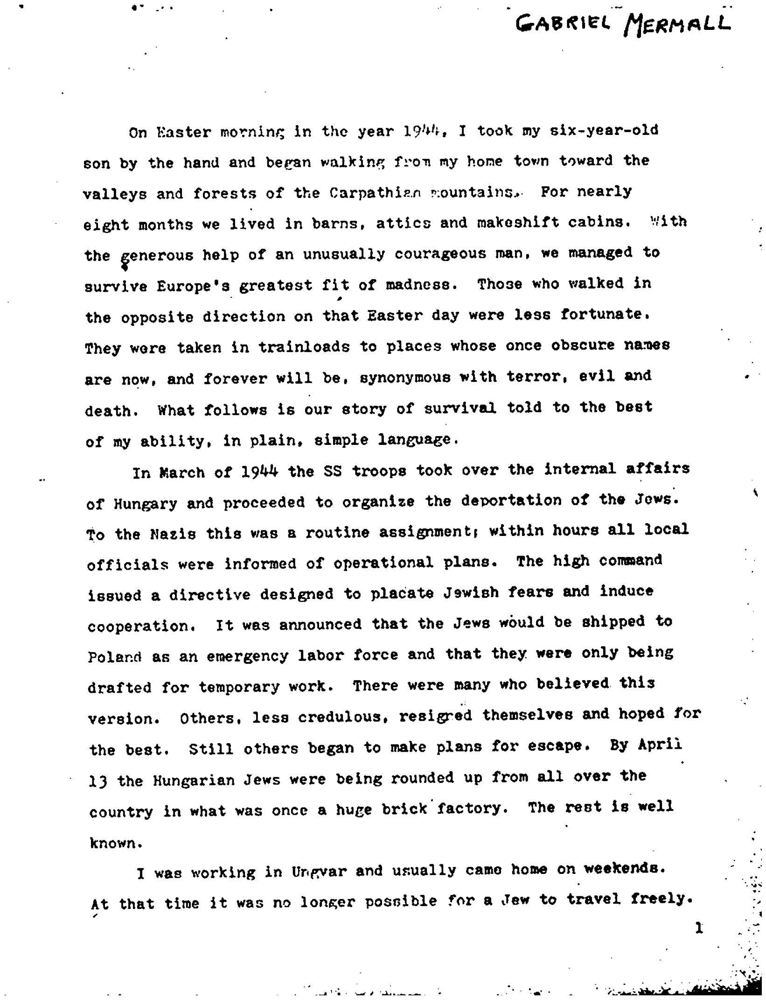

In [423]:
display("images/no_noise.png")

In our case the noise removal wasn't necessary but we've managed to see the process for some images and how it can be helpful to do this step. Again probably you won't need to do all the steps in this notebook in order to process an image but you can certainly learn from them.

Now we're gonna see what would be the solution if our document had a very boldy characters or very thin characters. The solution is part of what we just did and this are dilation and erosion.

In [424]:
#We're gonna suppouse that out image has too wide letters to be read by the ocr and we need to make them thiner. 
def thin_font(image):
    import numpy as np
    #Now one good step in order to do this is to invert the image
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    #we revert the image again in order to undo the inversion
    image = cv2.bitwise_not(image)
    return (image)

In [425]:
eroded_image = thin_font(no_noise_image)
cv2.imwrite("images/eroded_image.png",no_noise_image)

True

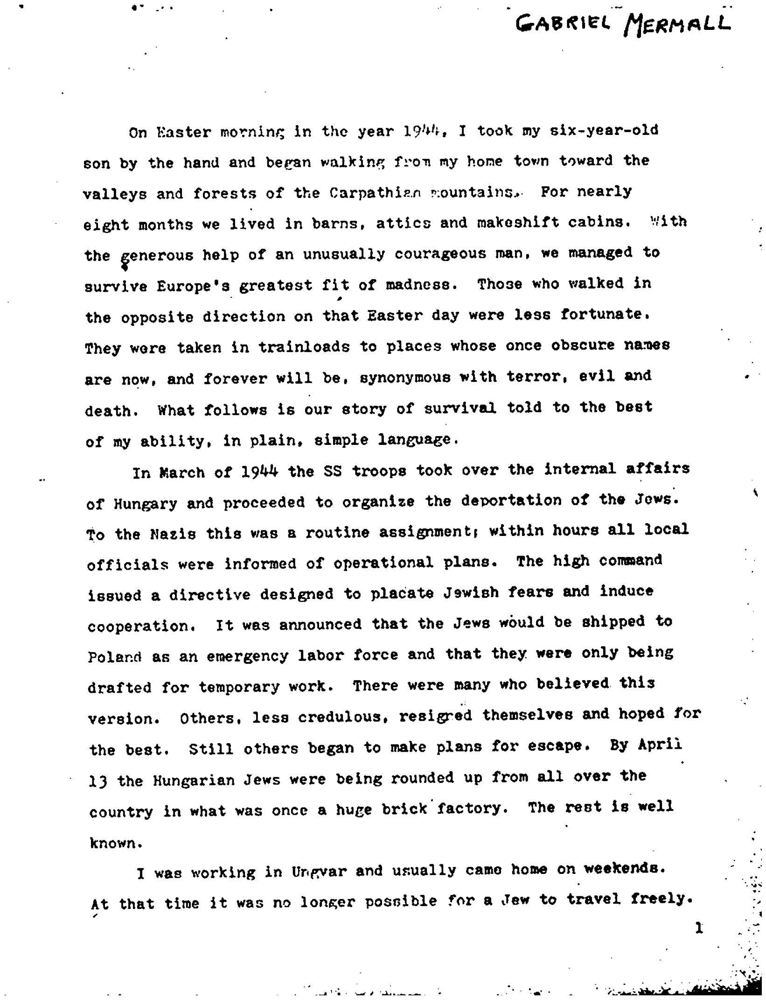

In [426]:
display("images/eroded_image.png")

As we can see our letters are now thinner, but what if we want to make them thicker? the function would be the same but changing just one part.

In [427]:
def thick_font(image):
    import numpy as np
    #Now one good step in order to do this is to invert the image
    image = cv2.bitwise_not(image)
    kernel = np.ones((3,3), np.uint8)
    image = cv2.dilate(image, kernel, iterations=20)
    #we revert the image again in order to undo the inversion
    image = cv2.bitwise_not(image)
    return (image)

In [428]:
dilated_image = thin_font(no_noise_image)
cv2.imwrite("images/dilated_image.png",no_noise_image)

True

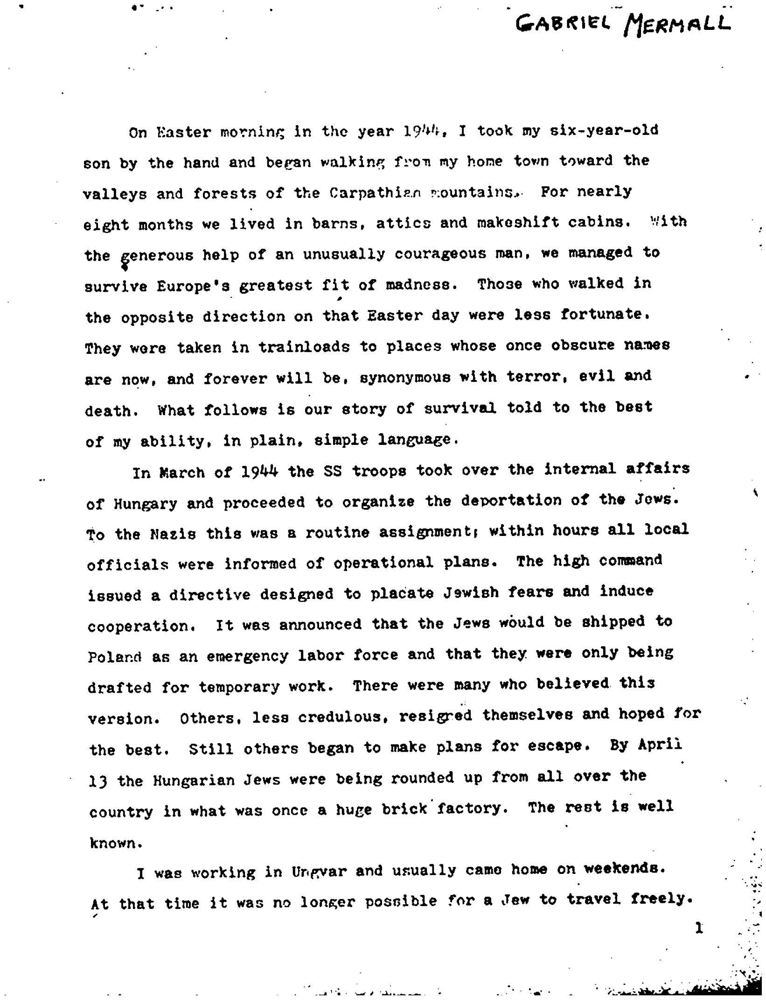

In [429]:
display("images/dilated_image.png")

SO as we can see in the two different images the letters have gone thicker. Remember that you can play with the number of iterations as well as with the number of the matrix in the kernel to try and obtain better results. Just as a note is important to remember that this processes would do the exact opposite if you don't invert the image at the start and end of the function.

We're gonna now take a look at rotation / deskewing part. This is important for documents that might be scanned turnining the image to horizontal, or maybe is just turned. We need to fix that for the ocr.

In [430]:
new_image_object = cv2.imread("images/rotated_image.jpg")
# display("images/rotated_image.png")

THis function here is quite useful. If we have a text whose orientation is different than horizontal this function will receive the image and, dividing by boxes, find the best way to fit the text into a box using the angle in order to do so. For his is vital to have NO BORDERS in the image because they can completly ruin the function.

In [431]:
#https://becominghuman.ai/how-to-automatically-deskew-straighten-a-text-image-using-opencv-a0c30aed83df
import numpy as np

def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)

    #Different options section for trying to correct the text. IMPORTANT: IF ANY OF THESE METHODS IS USED COMMENT THE LINE OF THE ANGLE BELOW

    #Added - use the average angle of all text blocks
    # allContourAngles = [cv2.minAreaRect(c)[-1] for c in contours]
    # angle = sum(allContourAngles) / len(allContourAngles)
    #Added

    #Added - take the angle of the middle block
    middleContour = contours[len(contours) // 2]
    angle = cv2.minAreaRect(middleContour)[-1]
    #Added

    #Added - try the average angle of largest, smallest and middle blocks
    # largestContour = contours[0]
    # middleContour = contours[len(contours) // 2]
    # smallestContour = contours[-1]
    # angle = sum([cv2.minAreaRect(largestContour)[-1], cv2.minAreaRect(middleContour)[-1], cv2.minAreaRect(smallestContour)[-1]]) / 3
    #Added

    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    #COMMENT THIS LINE IF ANY OF THE METHODS ABOVE IS USED
    #----------------------------------------------------------------------------------------------
    # angle = minAreaRect[-1]
    #----------------------------------------------------------------------------------------------
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle
# Rotate the image around its center

def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage

In [432]:
# Deskew image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

In [433]:
fixed = deskew(new_image_object)
cv2.imwrite("temp/rotated_fixed.jpg",fixed)

27


True

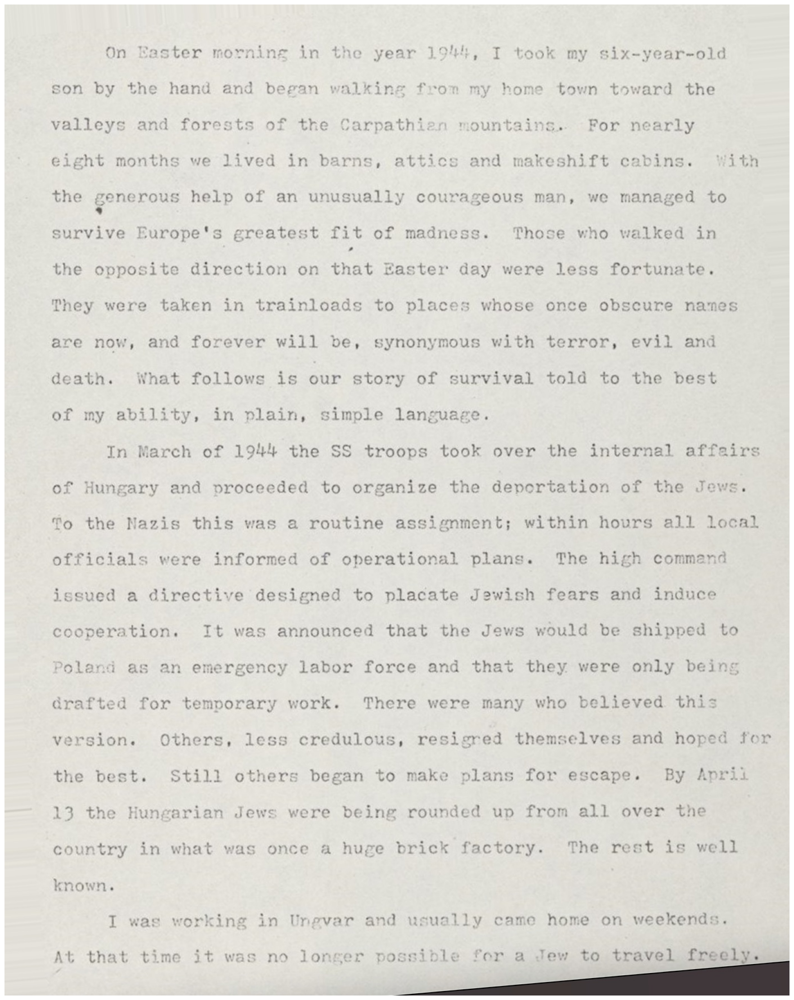

In [434]:
display("temp/rotated_fixed.jpg")

Right now the function is not working because it has some borders because of the screenshot. We need to remove those borders. Let's take a look at how to do it. 

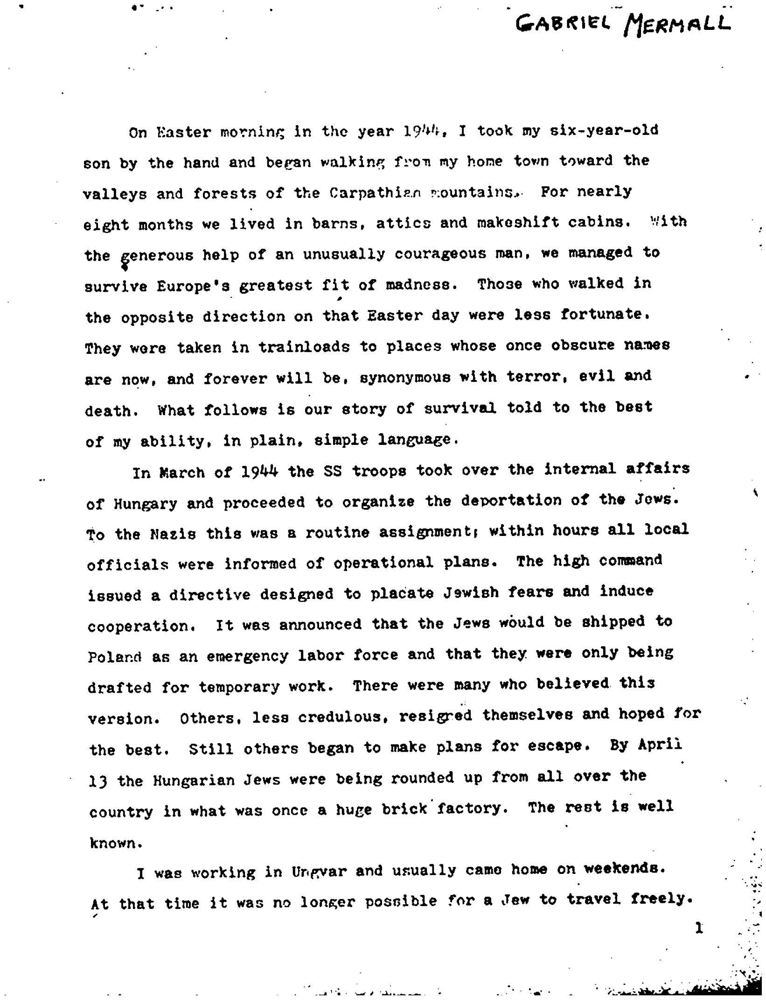

In [435]:
display("images/no_noise.png")

In [436]:
def remove_borders(image):
    contours, hierarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntSorted = sorted(contours, key=lambda x:cv2.contourArea(x))
    #This is gonna be the largest bounced box
    cnt = cntSorted[-1]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = image[y:y+h, x:x+w]
    return crop

THis function works good fon inconsistent borders along the dataset, because it finds the bigger "box" which corresponds to the border. If you have consistent borders is better to do this with a pdf library in order to process the image.

In [437]:
no_borders = remove_borders(no_noise_image)
cv2.imwrite("images/no_borders.jpg",no_borders)

True

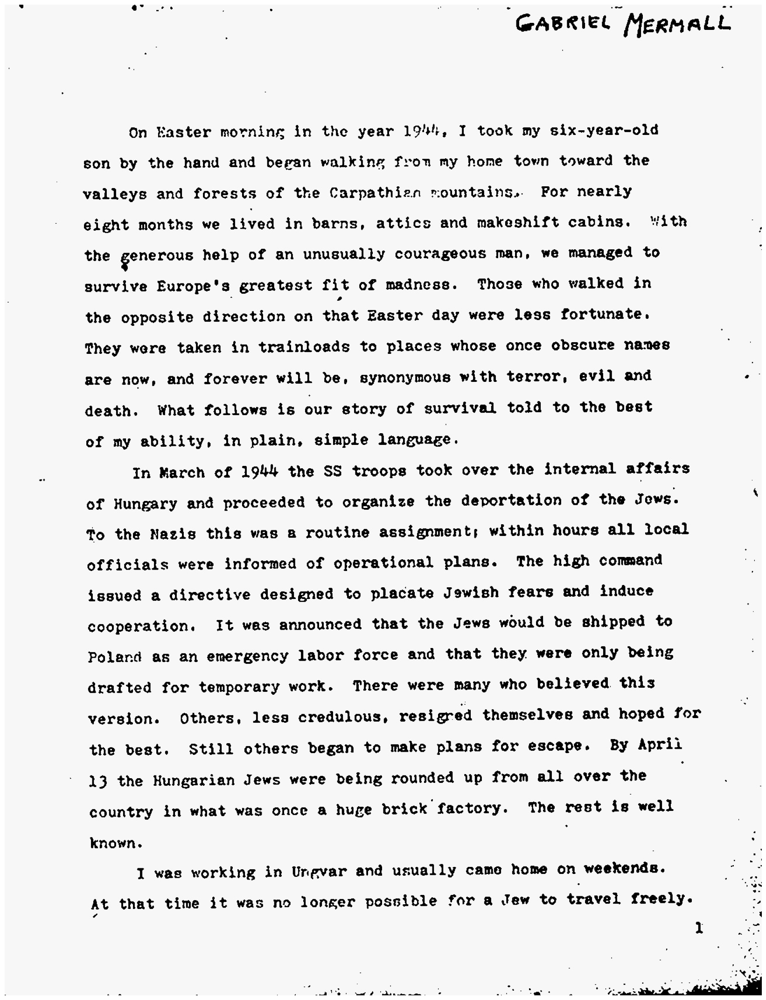

In [438]:
display("images/no_borders.jpg")

In our case there was no border so the image has not being croped. But try this same method with a borderred image and it will work perfectly.

So, now we know how to erase the borders but, What about if we want to add them? why we would want to do that?.

We want to add croped borders if our document has text right until the very end. There is also anothr reason, maybe the model that we're using was trained with borders and it will perform better with them. Either way let's see how to do it.

In [440]:
#First we need to specify the color of the border. In our case we will use white
color = [255, 255, 255]
top, bottom, left, right = [150]*4

#Now we create an image with borders
image_with_borders = cv2.copyMakeBorder(no_borders,top,bottom,left,right,cv2.BORDER_CONSTANT, value=color)
cv2.imwrite("images/image_added_border.jpg",image_with_borders)

True

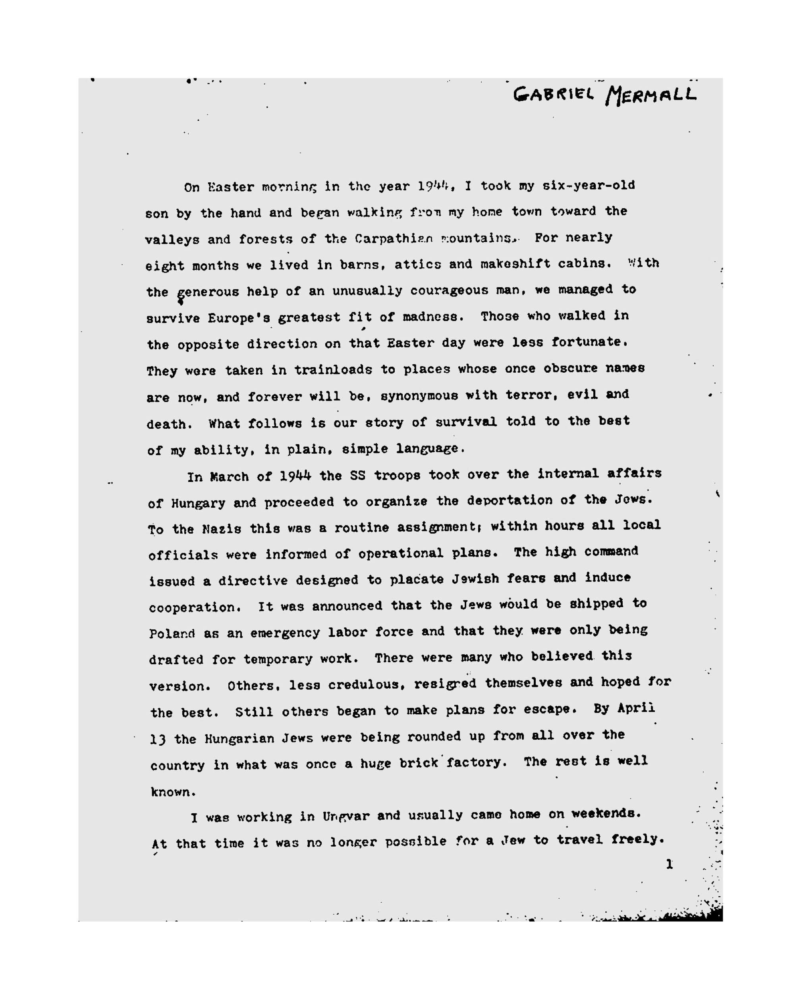

In [441]:
display("images/image_added_border.jpg")